In [2]:
import math
import os
import sys
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import ndimage

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential, Model
from keras.layers import Conv2D, MaxPooling2D, Dense, Activation, Dropout, Flatten
from keras.layers.normalization import BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from keras.regularizers import l2, l1

Using TensorFlow backend.


In [3]:
path = '/Users/Alan/Downloads/planesnet/'
file = path + 'planesnet.json'
data = pd.read_json(file)
data.describe()
data

,data,labels,locations,scene_ids
0,"[206, 195, 187, 183, 177, 175, 174, 193, 198, ...",1,"[-118.40497658522878, 33.940618514147936]",20170620_175442_0e30
1,"[215, 209, 200, 196, 192, 197, 205, 168, 155, ...",1,"[-122.392469714, 37.6176425378]",20161212_180859_0e30
2,"[204, 214, 220, 219, 213, 205, 198, 193, 199, ...",1,"[-122.397578597, 37.6209247852]",20170524_181349_0e2f
3,"[179, 174, 179, 178, 173, 170, 168, 168, 168, ...",1,"[-122.214849831, 37.7203378331]",20161110_180707_0e1f
4,"[222, 222, 218, 214, 208, 205, 207, 206, 206, ...",1,"[-117.862173435, 33.6796854072]",20160813_184932_0c64
5,"[190, 186, 183, 181, 167, 195, 217, 198, 176, ...",1,"[-118.3876846525824, 33.934047747716676]",20170721_175019_1004
6,"[222, 230, 228, 231, 235, 237, 230, 231, 235, ...",1,"[-117.19879528524052, 32.73294889199829]",20170621_175034_0e3a
7,"[239, 234, 245, 247, 241, 239, 221, 201, 190, ...",1,"[-122.393225359, 37.6179558959]",20170527_180745_1021
8,"[195, 194, 195, 200, 196, 193, 202, 206, 206, ...",1,"[-121.927543563, 37.366855368]",20170404_003643_1_0c38
9,"[201, 209, 174, 161, 174, 197, 194, 195, 195, ...",1,"[-122.381640238, 37.6147551673]",20170211_181118_0e16


In [1]:
import pandas_profiling

In [4]:
pandas_profiling.ProfileReport(data)

Number of variables,4
Number of observations,32000
Total Missing (%),0.0%
Total size in memory,1.2 MiB
Average record size in memory,40.0 B
Numeric,0
Categorical,1
Boolean,1
Date,0
Text (Unique),0
Rejected,0


Total number of planes images in the dataset:  32000


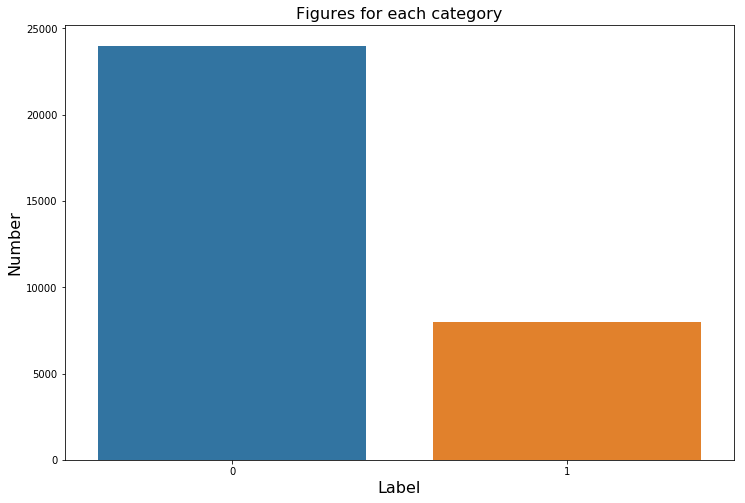

In [4]:
print("Total number of planes images in the dataset: ", len(data))
ac_count = data['labels'].value_counts()
plt.figure(figsize=(12,8))
sns.barplot(x=ac_count.index, y=ac_count.values)
plt.title("Figures for each category", fontsize=16)
plt.xlabel("Label", fontsize=16)
plt.ylabel("Number", fontsize=16)
plt.show()


In [10]:
import geojsonio
import geopandas as gpd
from geojsonio import display
from shapely.geometry import Point, polygon
import proj

In [15]:
import folium

In [11]:
locs = data['locations']

In [12]:
XX = locs.tolist()

In [13]:
def swap(vect):
    vect[1],vect[0] = vect[0], vect[1]

In [14]:
r = []
for i in range(len(XX)):
    j = XX[i]
    swap(j)
    r.append(j)

In [16]:
mymap = folium.Map(location=r[0],zoom_start=12)

In [17]:
for i in range(0,len(r)):
    folium.Circle(
      location=r[i],
      radius=100,
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(mymap)


In [18]:
mymap

In [68]:
import reverse_geocoder as rg 
import pprint 
  
def reverseGeocode(coordinates): 
    result = rg.search(coordinates) 
    return result

In [92]:
p = tuple(tuple(x) for x in r)

In [97]:
auxdata = reverseGeocode(p)

In [105]:
auxdata[0]

OrderedDict([('lat', '33.91918'),
             ('lon', '-118.41647'),
             ('name', 'El Segundo'),
             ('admin1', 'California'),
             ('admin2', 'Los Angeles County'),
             ('cc', 'US')])

In [119]:
cities = []
state = []
county = []
countries = []
for i in range(len(auxdata)):
    a1 = auxdata[i]['name']
    a2 = auxdata[i]['cc']
    a3 = auxdata[i]['admin1']
    a4 = auxdata[i]['admin2']
    cities.append(a1)
    countries.append(a2)
    state.append(a3)
    county.append(a4)


In [114]:
unique_cities = list(set(cities))
len(unique_cities)

242

In [120]:
unique_counties = list(set(county))
unique_counties

['Yolo County',
 'Los Angeles County',
 'Orange County',
 'San Mateo County',
 'Santa Clara County',
 'San Diego County',
 'San Bernardino County',
 'Riverside County',
 'San Francisco County',
 'Contra Costa County',
 'Sacramento County',
 'Alameda County',
 'Ventura County',
 'Marin County']

In [118]:
unique_state = list(set(state))
unique_state

['California']

In [112]:
unique_countries = list(set(countries))
unique_countries

['US']

In [6]:
x = []
for d in data['data']:
    d = np.array(d)
    x.append(d.reshape(( 3, 20 * 20)).T.reshape( (20,20,3) ))
x = np.array(x)
y = np.array(data['labels'])
print(x.shape)
print(y.shape)

(32000, 20, 20, 3)
(32000,)


In [7]:
x_train, x_test, y_train, y_test = train_test_split(x, y, 
                                                    test_size = 0.20,
                                                    random_state=0)



In [8]:
scalar = MinMaxScaler()

scalar.fit(x_train.reshape(x_train.shape[0],-1))
x_train = scalar.transform(x_train.reshape(x_train.shape[0],-1)).reshape(x_train.shape)
x_test = scalar.transform(x_test.reshape(x_test.shape[0],-1)).reshape(x_test.shape)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [9]:
x_train[0]

array([[[0.68525896, 0.675     , 0.63562753],
        [0.68924303, 0.692     , 0.64143426],
        [0.69721116, 0.69795918, 0.66135458],
        ...,
        [0.67729084, 0.68016194, 0.63855422],
        [0.67460317, 0.68253968, 0.64173228],
        [0.68253968, 0.68163265, 0.64112903]],

       [[0.68      , 0.68273092, 0.64143426],
        [0.6812749 , 0.68924303, 0.64143426],
        [0.692     , 0.69795918, 0.65322581],
        ...,
        [0.68253968, 0.68032787, 0.64257028],
        [0.68253968, 0.67489712, 0.644     ],
        [0.684     , 0.68032787, 0.64940239]],

       [[0.67857143, 0.67489712, 0.63967611],
        [0.67330677, 0.68273092, 0.64      ],
        [0.68924303, 0.69387755, 0.64634146],
        ...,
        [0.672     , 0.684     , 0.6468254 ],
        [0.684     , 0.68163265, 0.64940239],
        [0.66135458, 0.65432099, 0.62903226]],

       ...,

       [[0.71713147, 0.71428571, 0.668     ],
        [0.728     , 0.7231405 , 0.684     ],
        [0.69047619, 0

In [ ]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

In [ ]:
# creating the convolutional model

def create_cnn(data_shape):

    kernel_size = 3
    
    model = Sequential()

    model.add(Conv2D(16, (kernel_size), strides=(1,1), padding='valid',input_shape=(data_shape[1], data_shape[2], data_shape[3])))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    model.add(Conv2D(32, (kernel_size), strides=(1,1), padding='valid'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    model.add(Conv2D(64, (kernel_size), strides=(1,1), padding='valid'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))

    model.add(Conv2D(64, (kernel_size), strides=(1,1), padding='valid'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(64, (kernel_size), strides=(1,1), padding='valid'))
    model.add(BatchNormalization())
    model.add(Activation('relu'))
    model.add(MaxPooling2D((2,2)))
    
    model.add(Flatten())
    model.add(Dropout(0.5))

    model.add(Dense(1, activation='sigmoid'))

    return model

model = create_cnn(x_train.shape)
print(model.summary())

In [ ]:
opt = Adam(lr=0.01)
epochs = 1
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
history = model.fit(x_train, y_train, batch_size=64, epochs=epochs, shuffle=True, verbose=1)

In [ ]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches((15,5))
ax[0].plot(range(1,epochs+1), history.history['loss'], c='blue', label='Training loss')
#ax[0].plot(range(1,epochs+1), history.history['val_loss'], c='red', label='Validation loss')
ax[0].legend()
ax[0].set_xlabel('epochs')

ax[1].plot(range(1,epochs+1), history.history['acc'], c='blue', label='Training accuracy')
#ax[1].plot(range(1,epochs+1), history.history['val_acc'], c='red', #label='Validation accuracy')
ax[1].legend()
ax[1].set_xlabel('epochs')

In [ ]:
import random
from matplotlib import pyplot as plt

prediction = model.predict_classes(x_test)

for i in range(10):
    rand_int = random.randrange(0,len(x_test))
    img = np.array(data['data'][rand_int]) / 255.
    img = img.reshape((3, 400)).T.reshape((20,20,3))
    label = data['labels'][rand_int]
    plt.imshow(img)
    plt.show()
    pred_id = prediction[rand_int]

    # Output acutal and predicted class - 0 = 'no-plane', 1 = 'plane'
    print('Actual Class: ' + str(label))
    print('Predicted Class: ' + str(pred_id))

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
confusion_matrix(y_test, prediction)

In [ ]:
classes_names = np.unique(prediction)

In [ ]:
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

In [ ]:
np.set_printoptions(precision=2)
class_names =[0.,1.]

from sklearn.utils.multiclass import unique_labels

plot_confusion_matrix(y_test,prediction, classes=classes_names,normalize=True,
                      title='Confusion matrix with normalization')

In [ ]:
ind = np.where(prediction==1)

In [ ]:
x_test = scalar.inverse_transform(x_test.reshape(x_test.shape[0], -1)).reshape(x_test.shape)

In [ ]:
x_test[0].reshape(1200,1).T

In [ ]:
x = []
for d in range(x_test.shape[0]):
    j = x_test[d].reshape(1200,1)
    x = np.append(x,j)


x.reshape(int(len(x)/1200),1200)

In [ ]:
x[1200]